# 3.3 知っていると便利な可視化手法

[timevis](https://cran.r-project.org/web/packages/timevis/vignettes/timevis.html)パッケージは使用する為にインストールが必要。

## 1次元

In [1]:
install.packages("timevis")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



無作為に抽出した20人分の標本において、ガントチャートを用いて各寄付者の活動の重なりを分布としてある程度捉えられている。

※ Github上のプレビューでは表示されない。

In [2]:
require(data.table)
require(timevis)

url       <- "https://raw.githubusercontent.com/PracticalTimeSeriesAnalysis/BookRepo/master/Ch02/data/donations.csv"
donations <- fread(url)
d         <-donations[, .(min(timestamp), max(timestamp)), user]
names(d)  <- c("content", "start", "end")
d         <- d[start != end]

timevis(d[sample(1:nrow(d), 20)])

Loading required package: data.table

Loading required package: timevis



HTML widgets cannot be represented in plain text (need html)

## 2次元

RはPythonのNumPyなどと違って列優先であるため、`t()`にて転置してあげることで行に年、列に月を表示することが出来る。

In [3]:
t(matrix(AirPassengers, nrow = 12, ncol = 12))

112,118,132,129,121,135,148,148,136,119,104,118
115,126,141,135,125,149,170,170,158,133,114,140
145,150,178,163,172,178,199,199,184,162,146,166
171,180,193,181,183,218,230,242,209,191,172,194
196,196,236,235,229,243,264,272,237,211,180,201
204,188,235,227,234,264,302,293,259,229,203,229
242,233,267,269,270,315,364,347,312,274,237,278
284,277,317,313,318,374,413,405,355,306,271,306
315,301,356,348,355,422,465,467,404,347,305,336
340,318,362,348,363,435,491,505,404,359,310,337
360,342,406,396,420,472,548,559,463,407,362,405


年毎に系列を分けて可視化することで、データを季節で理解することが出来る。

7月、8月の大きなピークに加えて、3月にも小さなピークが存在することが分かる。

年を経るごとに堅調な成長がみられる。

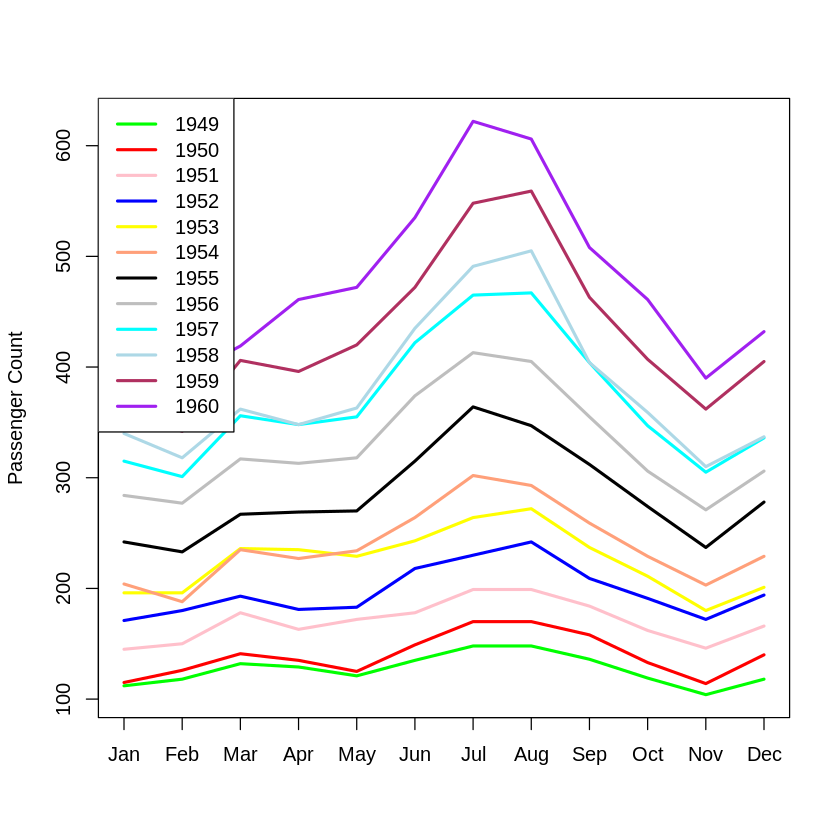

In [4]:
colors <- c("green", "red", "pink", "blue",
           "yellow", "lightsalmon", "black", "gray",
           "cyan", "lightblue", "maroon", "purple")

matplot(matrix(AirPassengers, nrow = 12, ncol = 12),
        type = "l", col = colors, lty = 1, lwd = 2.5,
        xaxt = "n", ylab = "Passenger Count")

legend("topleft", legend = 1949:1960, lty = 1, lwd = 2.5,
       col = colors)

axis(1, at = 1:12, labels = c("Jan", "Feb", "Mar", "Apr",
                              "May", "Jun", "Jul", "Aug",
                              "Sep", "Oct", "Nov", "Dec"))

[forecast](https://www.rdocumentation.org/packages/forecast/)パッケージを使うともっと簡単に作成できる。

Loading required package: forecast

Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 



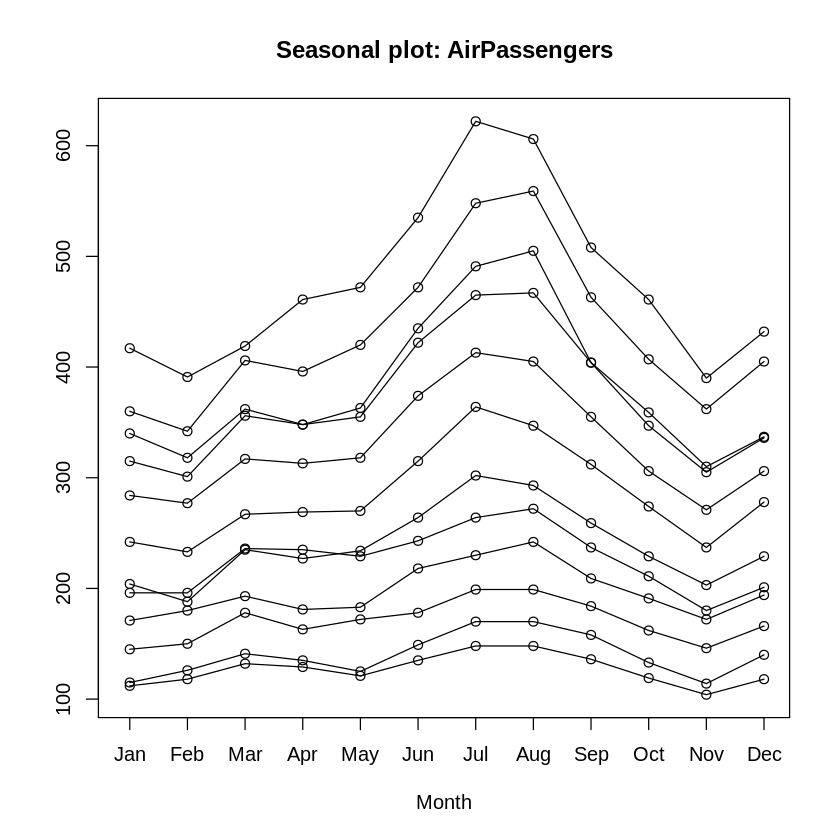

In [5]:
require(forecast)

seasonplot(AirPassengers)

年毎のプロットほど標準的ではないが、月ごとのプロットも役に立つ。

成長トレンドが年々加速している。

7月、8月の成長が他の月より早い。

1953年にピークのある月と無い月が存在する。

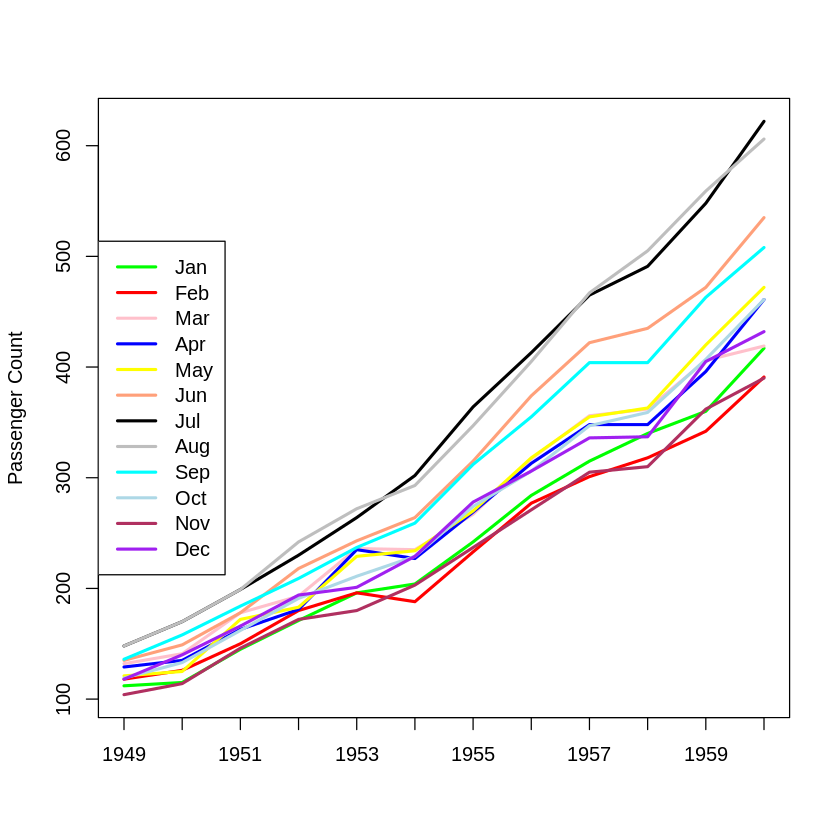

In [6]:
months <- c("Jan", "Feb", "Mar", "Apr", "May", "Jun",
            "Jul", "Aug", "Sep", "Oct", "Nov", "Dec")

matplot(t(matrix(AirPassengers, nrow = 12, ncol = 12)),
        type = "l", col = colors, lty = 1, lwd = 2.5,
        xaxt = "n", ylab = "Passenger Count")

legend("left", legend = months,
       col = colors, lty = 1, lwd = 2.5)

axis(1, at = 1:12, labels = 1949:1960)

`monthplot()`を用いると簡単に類似の可視化と洞察が得られる。

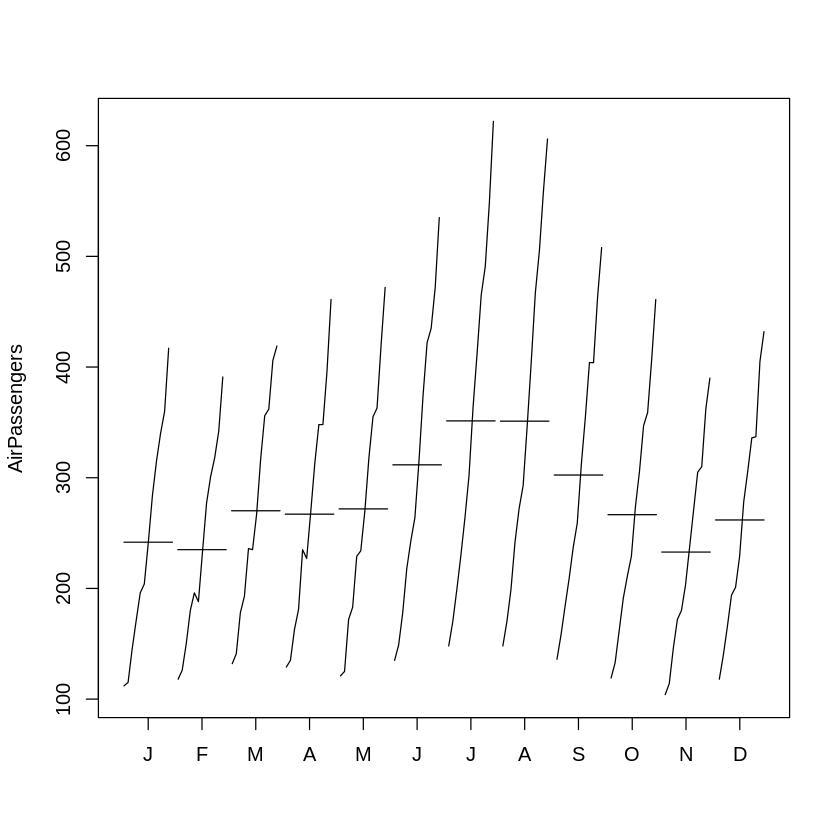

In [7]:
monthplot(AirPassengers)

2次元ヒストグラムの自作関数。

In [8]:
hist2d <- function(data, nbins.y, xlabels) {
    ymin = min(data)
    ymax = max(data) * 1.0001

    ybins = seq(from = ymin, to = ymax, length.out = nbins.y + 1)
    hist.matrix = matrix(0, nrow = nbins.y, ncol = ncol(data))

    for (i in 1:nrow(data)) {
        ts = findInterval(data[i, ], ybins)
        for (j in 1:ncol(data)) {
            hist.matrix[ts[j], j] = hist.matrix[ts[j], j] + 1
        }
    }
    hist.matrix
}

以下の2点から良い結果は得られていない。
- データ数が少ない
- トレンドがある（ヒストグラムの使用は、定常なデータセットを仮定している）

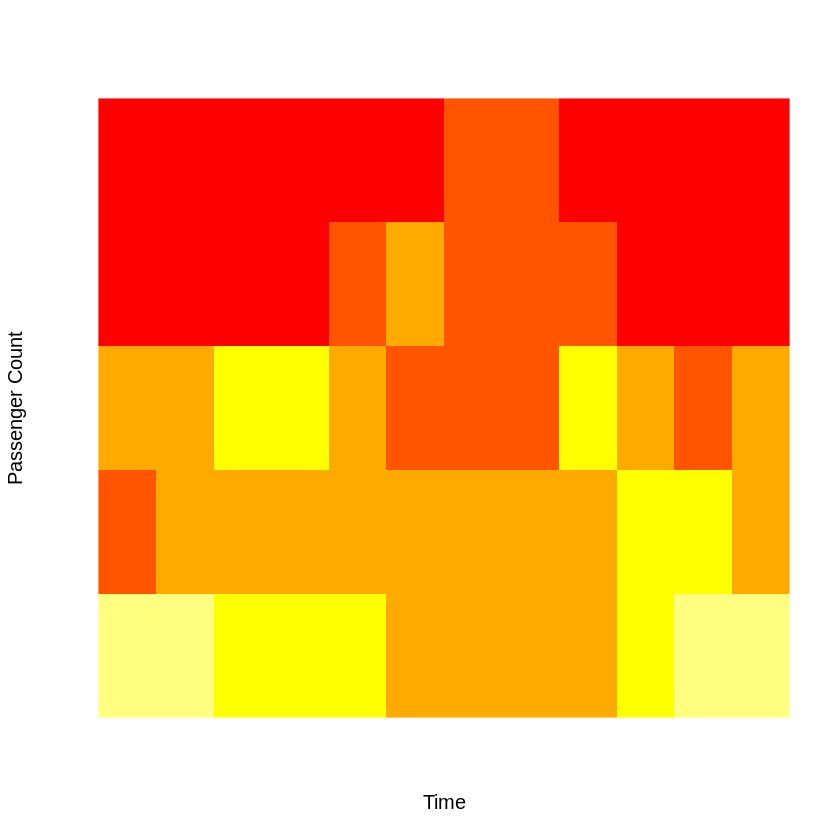

In [9]:
h = hist2d(t(matrix(AirPassengers, nrow = 12, ncol = 12)), 5, months)
image(1:ncol(h), 1:nrow(h), t(h), col = heat.colors(5),
      axes = FALSE, xlab = "Time", ylab = "Passenger Count")

FiftyWordsデータセットを使った2次元ヒストグラム。

左のプロットのカウントスケールは線形、右のプロットは対数スケール。

対数を取ることで、時系列の分散を小さくして外れ値の重みと外れ値間の距離が小さくなり、疎な分布が密に改善されている。

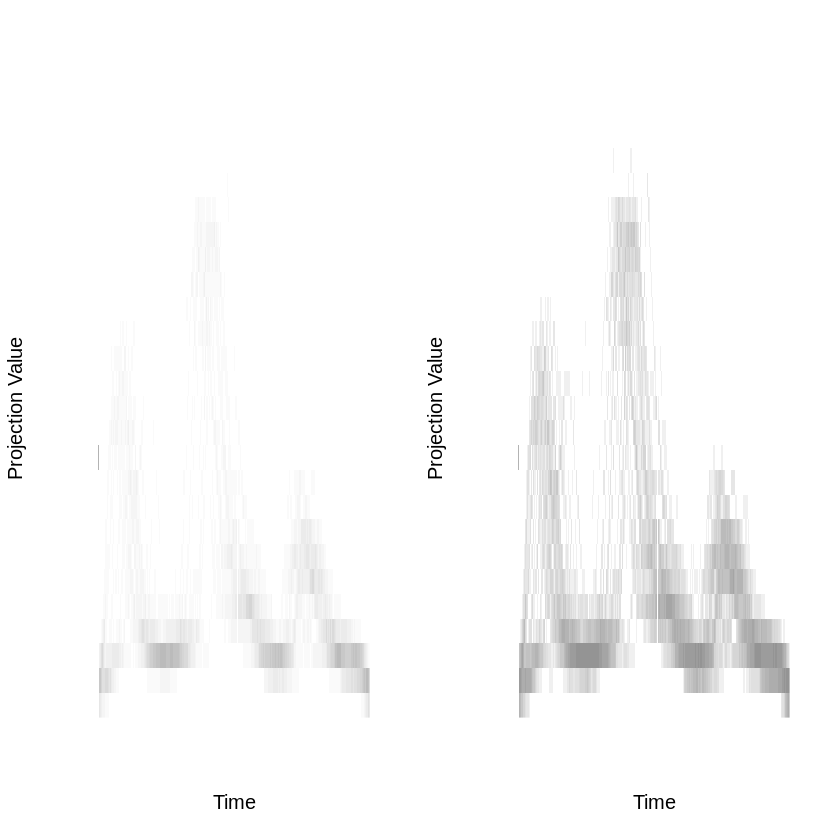

In [10]:
require(data.table)

url   <- "https://raw.githubusercontent.com/AileenNielsen/TimeSeriesAnalysisWithPython/master/data/50words_TEST.csv"

words <- fread(url)
w1    <- words[V1 == 1]

h = hist2d(w1, 25, 1:ncol(w1))

colors <- gray.colors(20, start = 1, end = .5)
par(mfrow = c(1, 2))
image(1:ncol(h), 1:nrow(h), t(h),
      col = colors, axes = FALSE, xlab = "Time", ylab = "Projection Value")
image(1:ncol(h), 1:nrow(h), t(log(h)),
      col = colors, axes = FALSE, xlab = "Time", ylab = "Projection Value")

自作の関数よりも既存の関数を使った方がより良い結果が得られる。

`melt()`にてwide formatのデータをlong formatに変換してから可視化している。

[1]  57 271

type,1,2,3,4,5,6,7,8,9,⋯,261,262,263,264,265,266,267,268,269,270
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,-0.83616,-0.81805,-0.79250,-0.76471,-0.73923,-0.71710,-0.69808,-0.68087,-0.66601,⋯,-0.72279,-0.72353,-0.72894,-0.73916,-0.75610,-0.78115,-0.81100,-0.83669,-0.85018,-0.85092
1,-0.61239,-0.56466,-0.59253,-0.65635,-0.68213,-0.66284,-0.65005,-0.65851,-0.65527,⋯,-0.24227,-0.28437,-0.33144,-0.37925,-0.43090,-0.48828,-0.53913,-0.58024,-0.62723,-0.68801
1,-0.95539,-0.91409,-0.85165,-0.79415,-0.75312,-0.72427,-0.69926,-0.67812,-0.66052,⋯,-0.68055,-0.70347,-0.72769,-0.75470,-0.78499,-0.81644,-0.84531,-0.87356,-0.90430,-0.93526
1,-0.71377,-0.67066,-0.64226,-0.61585,-0.58340,-0.54310,-0.50302,-0.45695,-0.39643,⋯,-0.61726,-0.63281,-0.65268,-0.67768,-0.71022,-0.75101,-0.79527,-0.83088,-0.84892,-0.84981
1,-1.05230,-0.99847,-0.92427,-0.81374,-0.65555,-0.44337,-0.18534,0.10384,0.40673,⋯,-1.03460,-1.04180,-1.04900,-1.05830,-1.07250,-1.09310,-1.11680,-1.13600,-1.14540,-1.14510
1,-0.84569,-0.82507,-0.79604,-0.76935,-0.75210,-0.74226,-0.73606,-0.72899,-0.72176,⋯,-0.66413,-0.66524,-0.67213,-0.68558,-0.70095,-0.71412,-0.72763,-0.74865,-0.78132,-0.81833


[1] 15390     3

type,variable,value
<int>,<fct>,<dbl>
1,1,-0.83616
1,1,-0.61239
1,1,-0.95539
1,1,-0.71377
1,1,-1.05230
1,1,-0.84569


[1] 15390     2

Time point,Value
<fct>,<dbl>
1,-0.83616
1,-0.61239
1,-0.95539
1,-0.71377
1,-1.05230
1,-0.84569


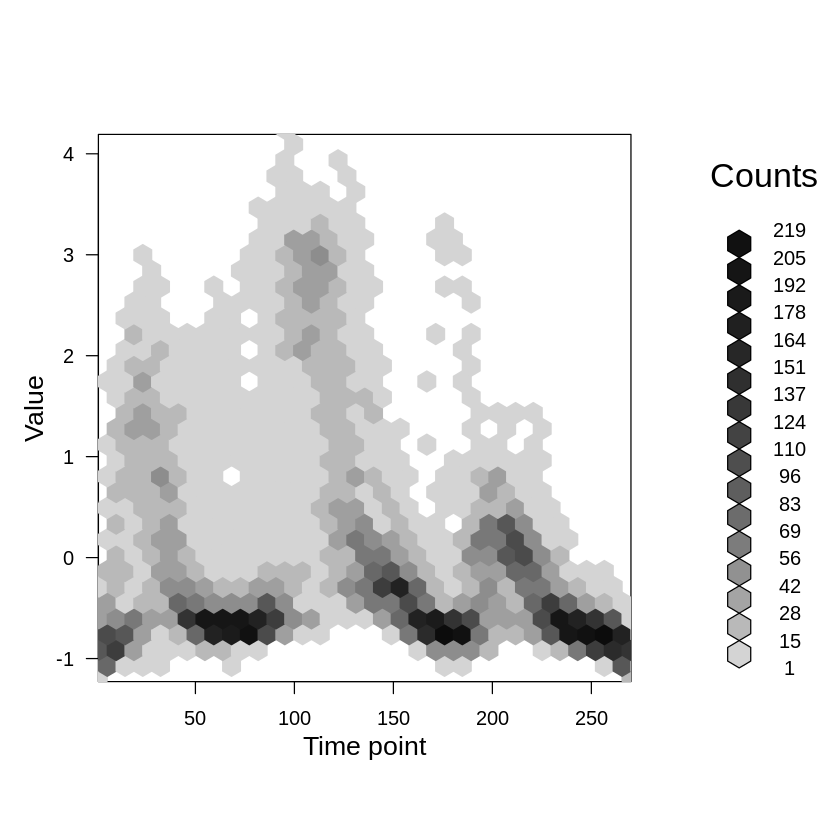

In [11]:
library(hexbin)

w1 <- words[V1 == 1]
names(w1) <- c("type", 1:270)
dim(w1)
head(w1)

w1 <- melt(w1, id.vars = "type")
dim(w1)
head(w1)

w1 <- w1[, -1]
names(w1) <- c("Time point", "Value")
dim(w1)
head(w1)

plot(hexbin(w1))

# 3次元

[plotly](https://plotly.com/graphing-libraries/)を使うことで簡単に3次元の可視化が可能。

※ Github上のプレビューでは表示されない。

In [12]:
install.packages("plotly")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



3次元の可視化は2次元よりも上手く形を捉えることが出来る場合がある。

In [13]:
require(plotly)
require(data.table)

months = 1:12
ap = data.table(matrix(AirPassengers, nrow = 12, ncol = 12))
names(ap) = as.character(1949:1960)
ap

ap[, month := months]
ap

ap = melt(ap, id.vars = "month")
names(ap) = c("month", "year", "count")
ap

p <- plot_ly(ap, x = ~month, y = ~year, z = ~count,
             color = ~as.factor(month)) %>%
    add_markers() %>%
    layout(scene = list(xaxis = list(title = "Month"),
                        yaxis = list(title = "Year"),
                        zaxis = list(title = "PassengerCount")))

p

Loading required package: plotly

Loading required package: ggplot2


Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout




1949,1950,1951,1952,1953,1954,1955,1956,1957,1958,1959,1960
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
112,115,145,171,196,204,242,284,315,340,360,417
118,126,150,180,196,188,233,277,301,318,342,391
132,141,178,193,236,235,267,317,356,362,406,419
129,135,163,181,235,227,269,313,348,348,396,461
121,125,172,183,229,234,270,318,355,363,420,472
135,149,178,218,243,264,315,374,422,435,472,535
148,170,199,230,264,302,364,413,465,491,548,622
148,170,199,242,272,293,347,405,467,505,559,606
136,158,184,209,237,259,312,355,404,404,463,508


1949,1950,1951,1952,1953,1954,1955,1956,1957,1958,1959,1960,month
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
112,115,145,171,196,204,242,284,315,340,360,417,1
118,126,150,180,196,188,233,277,301,318,342,391,2
132,141,178,193,236,235,267,317,356,362,406,419,3
129,135,163,181,235,227,269,313,348,348,396,461,4
121,125,172,183,229,234,270,318,355,363,420,472,5
135,149,178,218,243,264,315,374,422,435,472,535,6
148,170,199,230,264,302,364,413,465,491,548,622,7
148,170,199,242,272,293,347,405,467,505,559,606,8
136,158,184,209,237,259,312,355,404,404,463,508,9


month,year,count
<int>,<fct>,<dbl>
1,1949,112
2,1949,118
3,1949,132
4,1949,129
5,1949,121
6,1949,135
7,1949,148
8,1949,148
9,1949,136


Warning message in RColorBrewer::brewer.pal(N, "Set2"):
“n too large, allowed maximum for palette Set2 is 8
Returning the palette you asked for with that many colors
”
Warning message in RColorBrewer::brewer.pal(N, "Set2"):
“n too large, allowed maximum for palette Set2 is 8
Returning the palette you asked for with that many colors
”
Warning message in RColorBrewer::brewer.pal(N, "Set2"):
“n too large, allowed maximum for palette Set2 is 8
Returning the palette you asked for with that many colors
”
Warning message in RColorBrewer::brewer.pal(N, "Set2"):
“n too large, allowed maximum for palette Set2 is 8
Returning the palette you asked for with that many colors
”


HTML widgets cannot be represented in plain text (need html)

2次元のランダムウォークをプロットする。

インタラクティブに視点を変えることで示唆が得られる。

In [14]:
file.location <-
    "https://raw.githubusercontent.com/plotly/datasets/master/_3d-line-plot.csv"
data <- read.csv(file.location)
p <- plot_ly(data, x = ~x1, y = ~y1, z = ~z1,
             type = "scatter3d", mode = "lines",
             line = list(color = "#1f77b4", width = 1))

以下の2つの視点では、下の視点の方が啓発的。

※ Github上のプレビューでは表示されない。

In [15]:
p

HTML widgets cannot be represented in plain text (need html)

In [16]:
p

HTML widgets cannot be represented in plain text (need html)